# Load Model For Genception

## SAE Params

In [1]:
HIDDEN_SIZE = 256

## Imports

In [2]:
import pickle
import numpy as np
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression

import torch
from torch import nn 
from torch.utils.data import DataLoader

from models_and_data.nn import NeuralNetwork
from models_and_data.sae import SparseAutoencoder
from models_and_data.edgedataset import EdgeDataset

from models_and_data.model_helpers import (evaluate_and_gather_activations, get_sublabel_data, 
    get_top_N_features, extract_activations, load_intermediate_labels, seed_worker, SNE_plot_2d, SNE_plot_3d)

## Set Device to GPU

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"We will be using device: {device}")

We will be using device: cuda


## Load Data

In [4]:
# train data
train_images = load_intermediate_labels("./intermediate-labels/first_layer/train_images.pkl")
train_labels = load_intermediate_labels("./intermediate-labels/first_layer/train_labels.pkl")

# test data
test_images = load_intermediate_labels("./intermediate-labels/first_layer/test_images.pkl")
test_labels = load_intermediate_labels("./intermediate-labels/first_layer/test_labels.pkl")

# Model Loading

## Model Result Replication

In [5]:
seed = 42
generator = torch.Generator().manual_seed(seed)

NUM_WORKERS = 4
if device.type.lower() == "cpu":
    NUM_WORKERS = 0

# training data
train_dataset = EdgeDataset(train_images, train_labels)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=NUM_WORKERS,
                          worker_init_fn=seed_worker, generator=generator, pin_memory=True)

# test data
test_dataset = EdgeDataset(test_images, test_labels)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

In [6]:
model = NeuralNetwork().to(device)
sae_hidden_one = SparseAutoencoder(input_size=16, hidden_size=HIDDEN_SIZE).to(device)
sae_hidden_two = SparseAutoencoder(input_size=16, hidden_size=HIDDEN_SIZE).to(device)

In [8]:
best_model_path = "./SAE-Results/256-0.75/results/F1/models/25_top_0.14/25_top/best_model_lf_0.06.pth"
    
checkpoint = torch.load(best_model_path)
model.load_state_dict(checkpoint['model_state_dict'])
sae_hidden_one.load_state_dict(checkpoint['sae_one_state_dict'])
sae_hidden_two.load_state_dict(checkpoint['sae_two_state_dict'])

<All keys matched successfully>

## Verify Correct Model

In [9]:
train_results = evaluate_and_gather_activations(model, sae_hidden_one, sae_hidden_two, train_loader, device)
Z_train_one, Z_train_two, y_train = train_results["Z_one"], train_results["Z_two"], train_results["y"]

test_results = evaluate_and_gather_activations(model, sae_hidden_one, sae_hidden_two, test_loader, device)
Z_test_one, Z_test_two, y_test = test_results["Z_one"], test_results["Z_two"], test_results["y"]

print(f"Model acc: {test_results['accuracy']}")

Model acc: 93.2


In [10]:
sparsity_one = np.mean(Z_test_one > 1e-5) * Z_test_one.shape[1]
sparsity_two = np.mean(Z_test_two > 1e-5) * Z_test_two.shape[1]
print(f"Average Non-Zero Features per Image (Hidden One): {sparsity_one:.2f}")
print(f"Average Non-Zero Features per Image (Hidden Two): {sparsity_two:.2f}")

Average Non-Zero Features per Image (Hidden One): 39.54
Average Non-Zero Features per Image (Hidden Two): 25.53


In [11]:
print("\n--- Training Linear Probes ---")
clf_one = LogisticRegression(penalty='l2', max_iter=1000, n_jobs=-1)
clf_one.fit(Z_train_one, y_train)
acc_one = clf_one.score(Z_test_one, y_test)
print(f"Linear Probe Accuracy (Hidden One): {acc_one:.2%}")

clf_two = LogisticRegression(penalty='l2', max_iter=1000, n_jobs=-1)
clf_two.fit(Z_train_two, y_train)
acc_two = clf_two.score(Z_test_two, y_test)
print(f"Linear Probe Accuracy (Hidden Two): {acc_two:.2%}")


--- Training Linear Probes ---


/home/alex/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Linear Probe Accuracy (Hidden One): 93.36%
Linear Probe Accuracy (Hidden Two): 93.44%


# Clustering

In [12]:
activation_data = extract_activations(
    data_loader=train_loader,
    model=model,
    sae_one=sae_hidden_one,
    sae_two=sae_hidden_two,
    device=device
)

Extracting Activations: 100%|██████████████████████████████████████████████████████| 782/782 [00:01<00:00, 579.44it/s]


In [13]:
sparse_act_one = activation_data["sparse_one"]
max_feature_indices_sp_one = np.argmax(sparse_act_one, axis=1)

In [14]:
tsne = TSNE(n_components=2, random_state=42)
activations_2d = tsne.fit_transform(sparse_act_one)

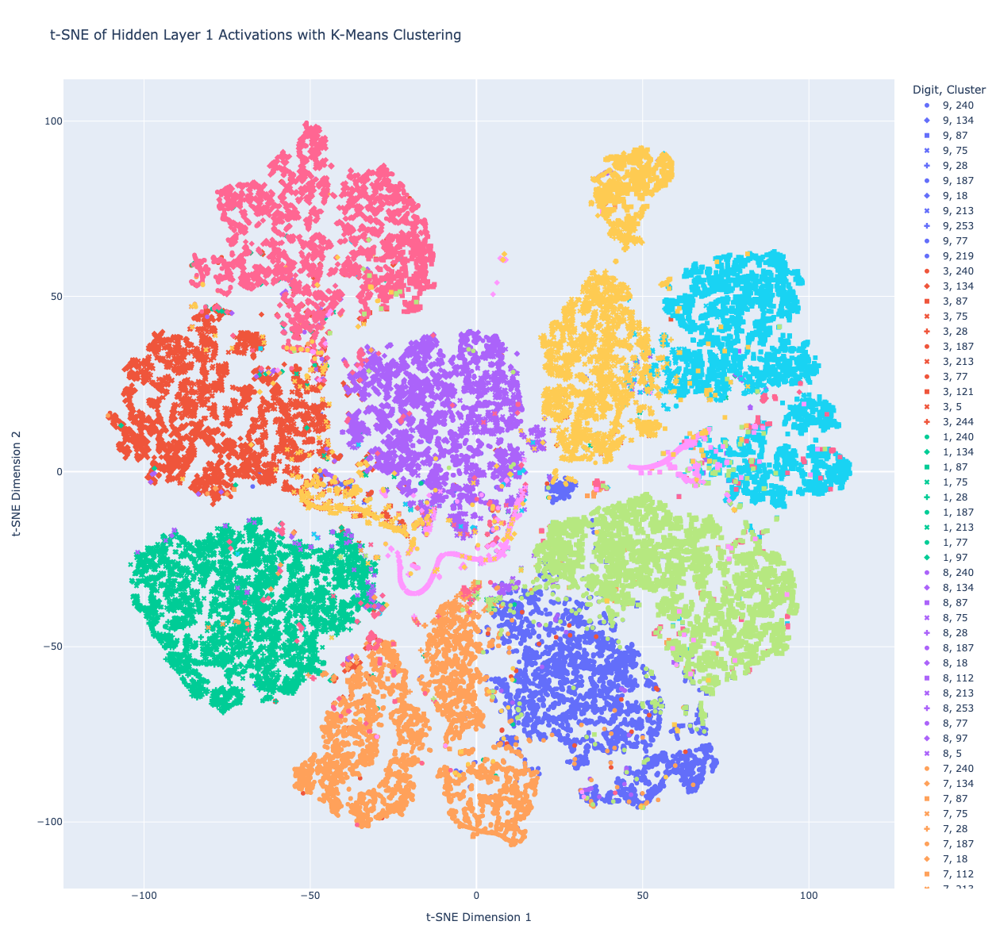

In [15]:
SNE_plot_2d(activations_2d=activations_2d, labels=activation_data["labels"], cluster_labels=max_feature_indices_sp_one)

In [16]:
tsne = TSNE(n_components=3, random_state=42)
activations_3d = tsne.fit_transform(sparse_act_one)

In [17]:
SNE_plot_3d(activations_3d=activations_3d, labels=activation_data["labels"], max_feature_indices_sp_one=max_feature_indices_sp_one)